# EXPERIMENT - STATE-GROUP-2

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [1]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

In [2]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [3]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.05]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.05


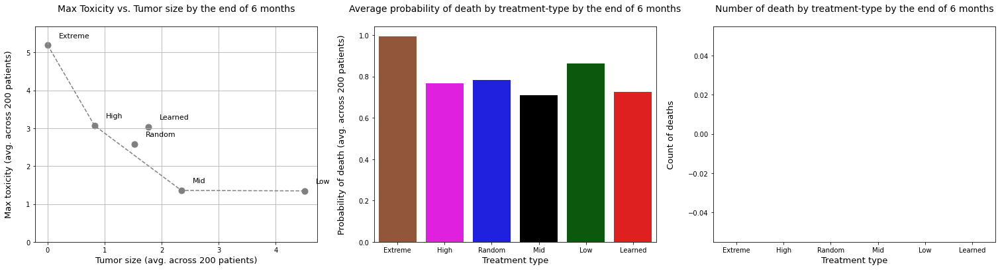

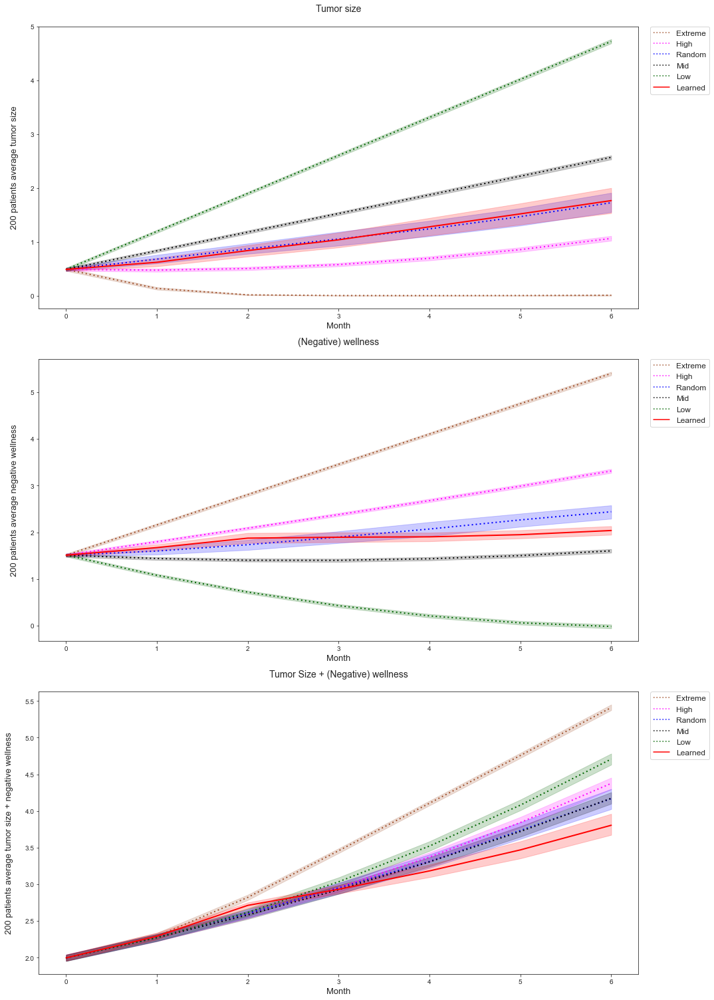


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.7676760862271337
                         - Avg. max. toxicity : 3.0400218886996906
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.116737534201349
                         - Avg. prob. of death : 0.7270037074157876



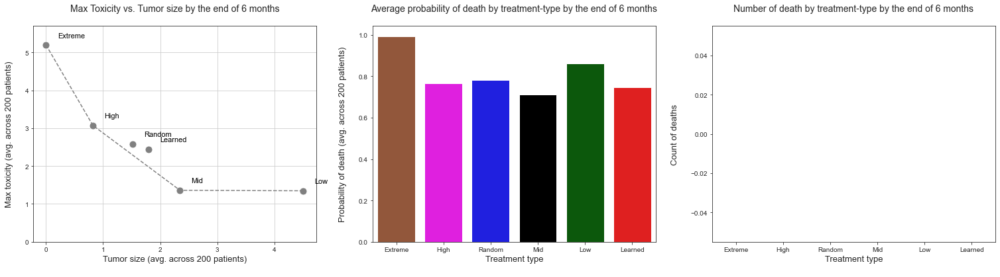

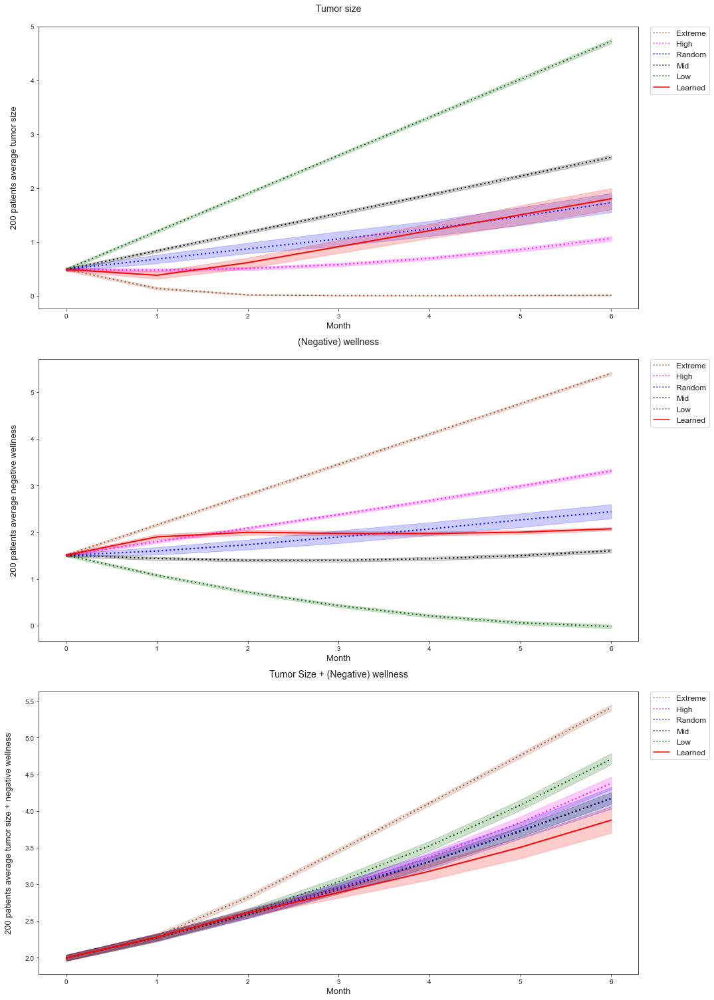


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 1.8016378223234062
                         - Avg. max. toxicity : 2.4405105510230047
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1153201948374902
                         - Avg. prob. of death : 0.7456090723905792



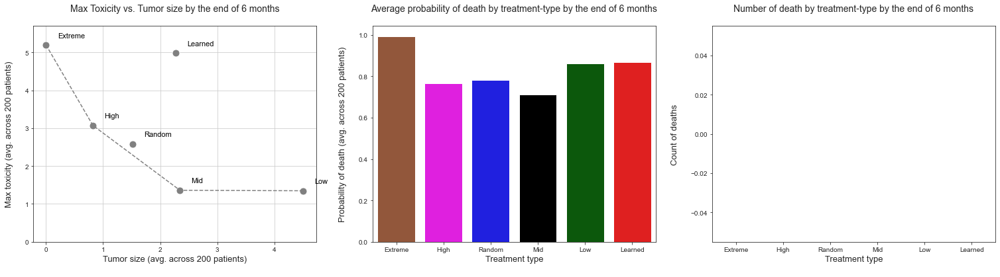

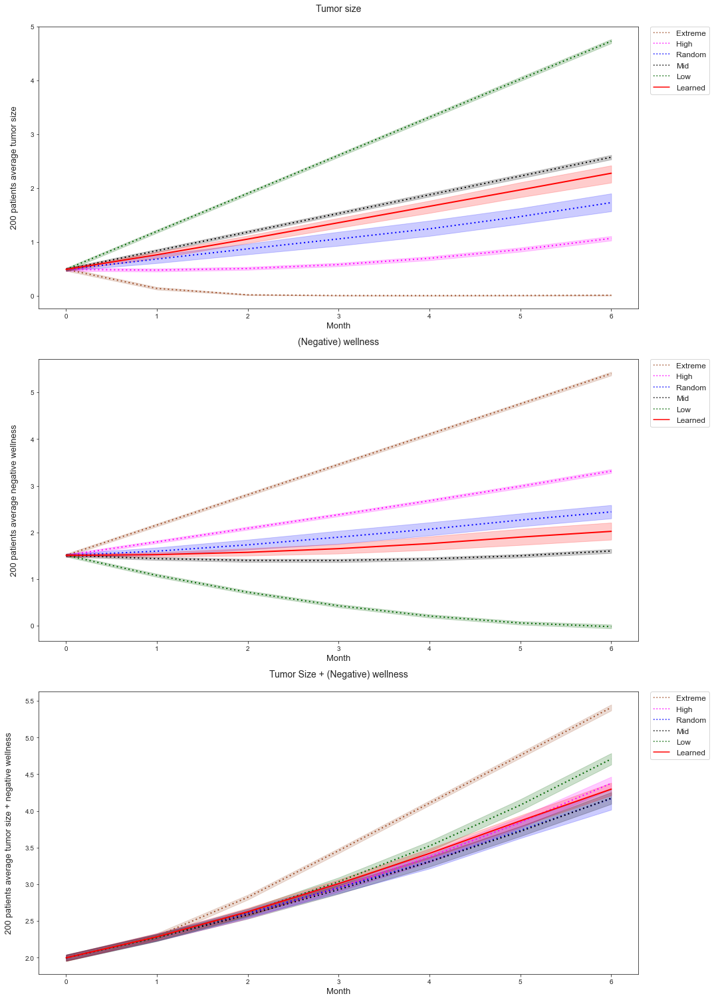


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 2.274157419880994
                         - Avg. max. toxicity : 4.9798167004780245
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1429943038846173
                         - Avg. prob. of death : 0.8671514444407655



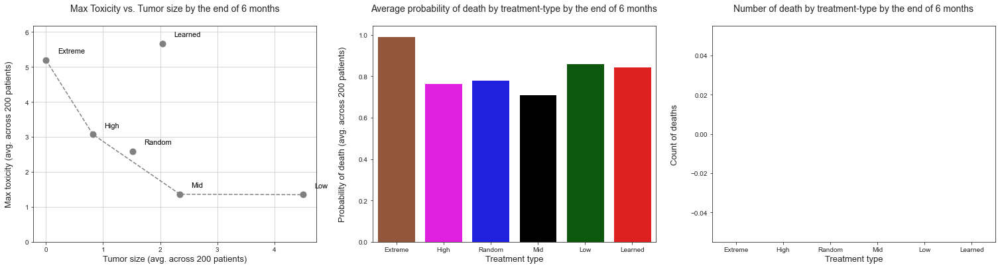

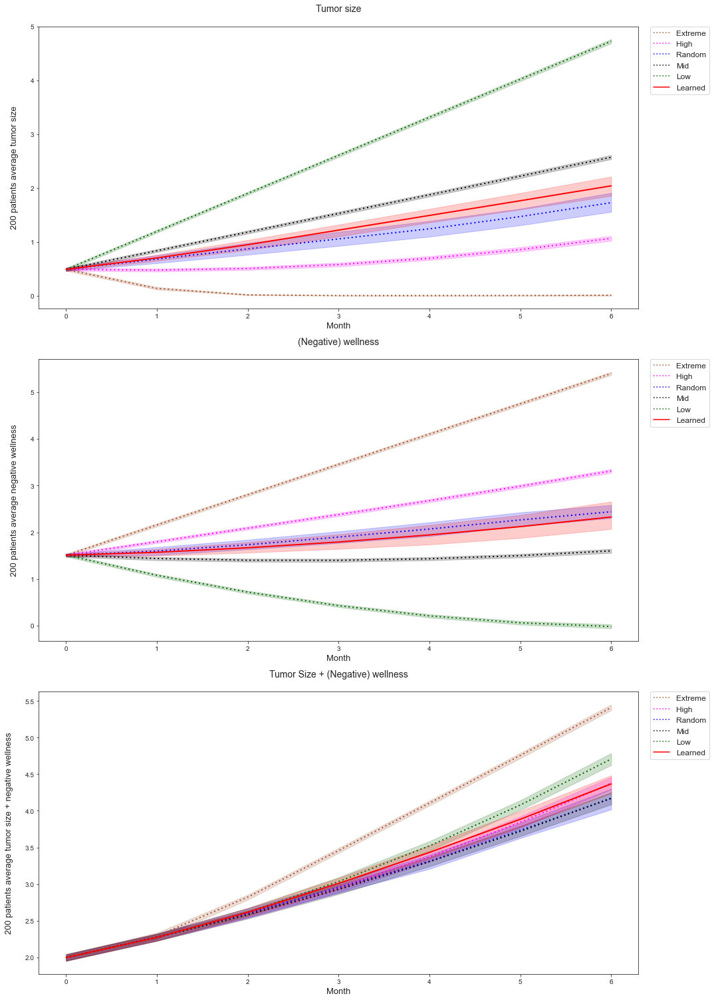


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 2.040880221822264
                         - Avg. max. toxicity : 5.670542306438069
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.145015801666458
                         - Avg. prob. of death : 0.8472943074093636



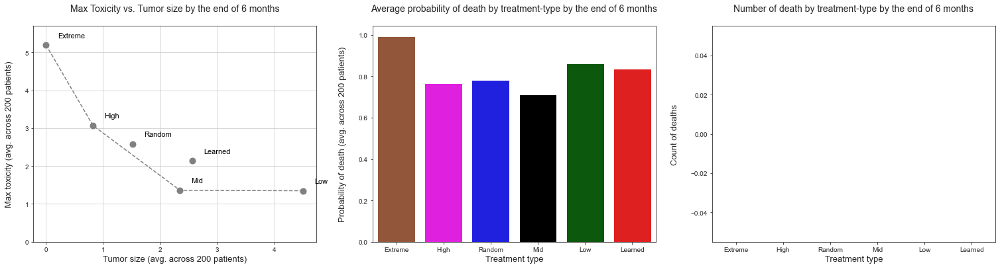

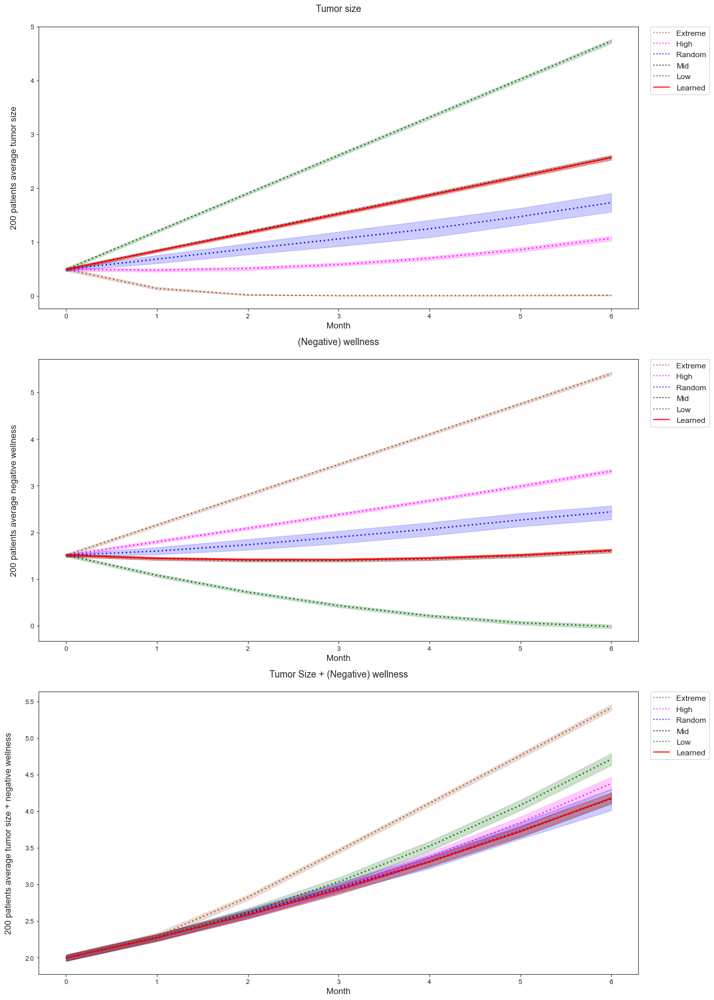


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 2.56498772345717
                         - Avg. max. toxicity : 2.1381165766074663
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1309140052361157
                         - Avg. prob. of death : 0.8357974691962083



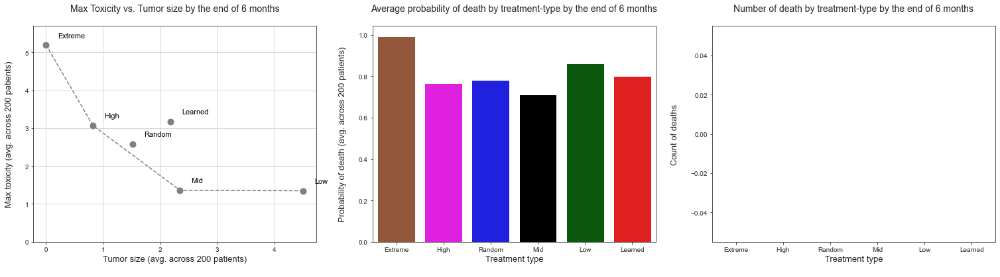

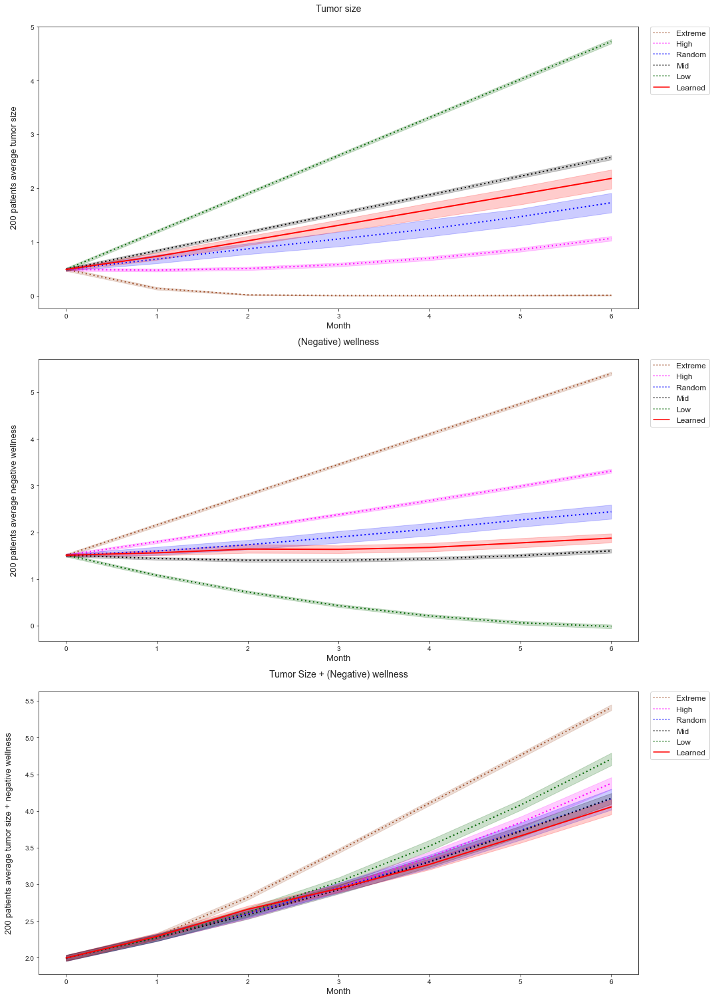


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 2.1799146774324982
                         - Avg. max. toxicity : 3.177306916567483
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1283265694329443
                         - Avg. prob. of death : 0.802174095624324



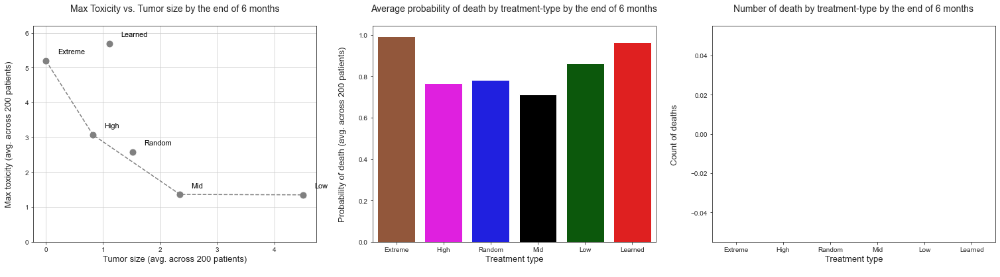

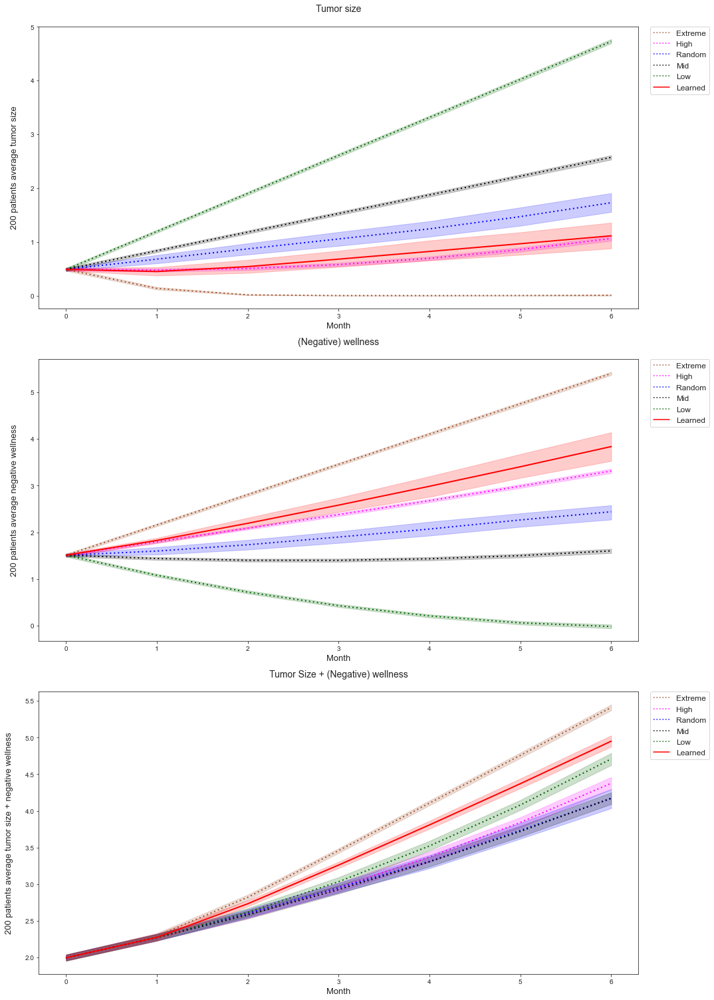


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 1.1136373243115616
                         - Avg. max. toxicity : 5.6930986933964265
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1882565474297873
                         - Avg. prob. of death : 0.9642947145271268

Averege death rate increased by 20%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [2:41:54<00:00, 9714.13s/it]


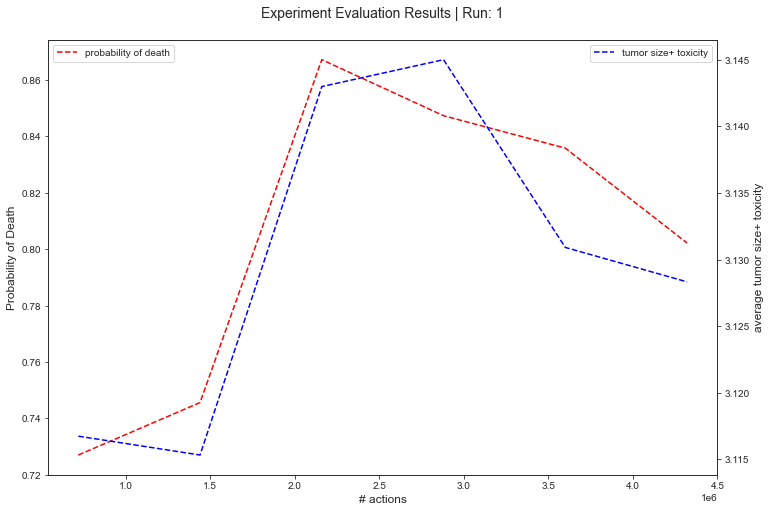

In [4]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 12
                                                , treatment_length_eval     = 12
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [5]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.05]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.05


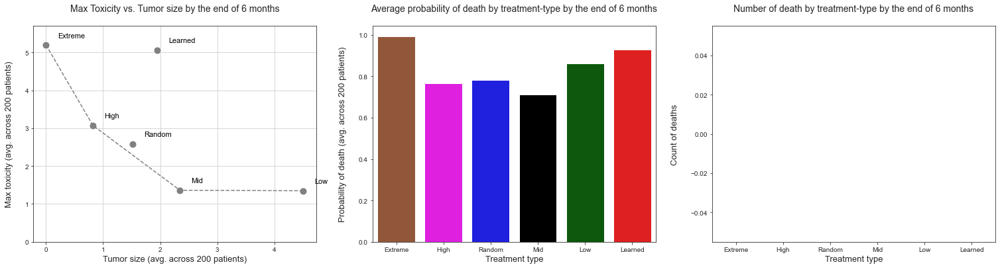

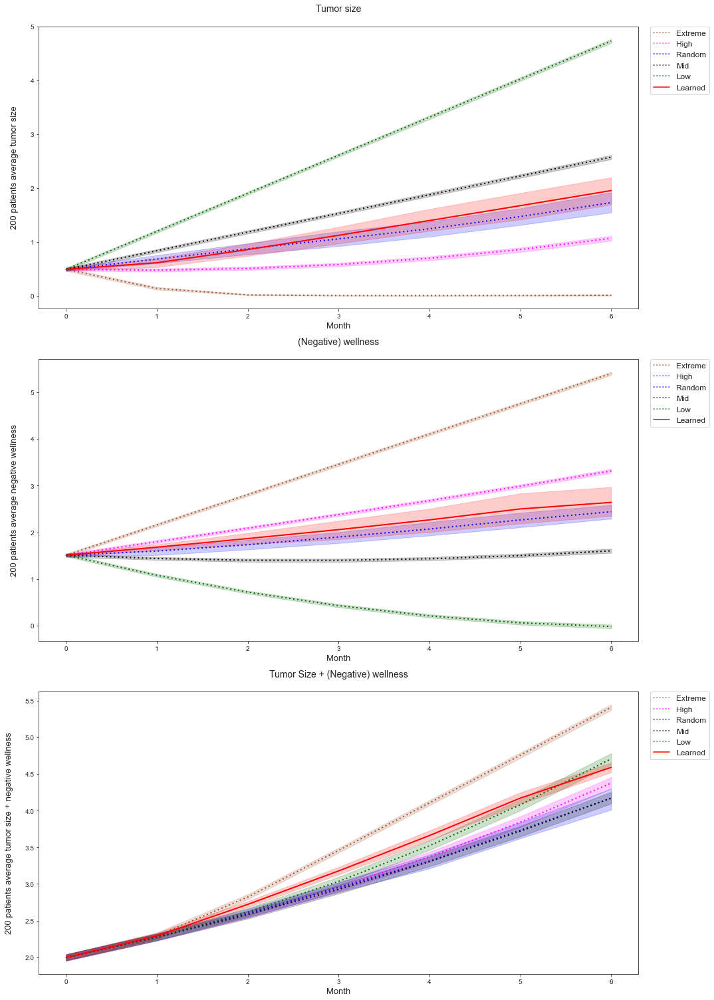


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.9512143392445607
                         - Avg. max. toxicity : 5.058952234491655
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.169588716295268
                         - Avg. prob. of death : 0.928600844966039



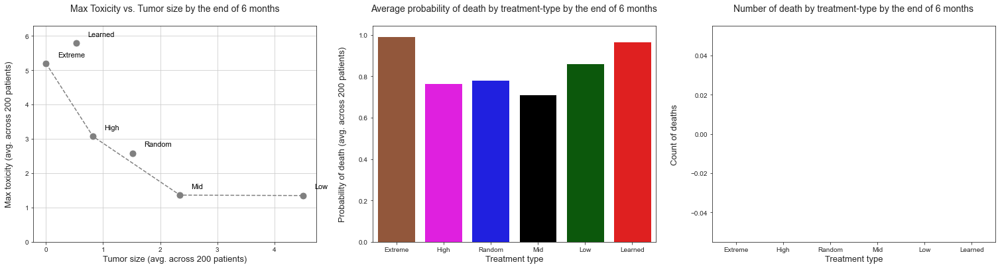

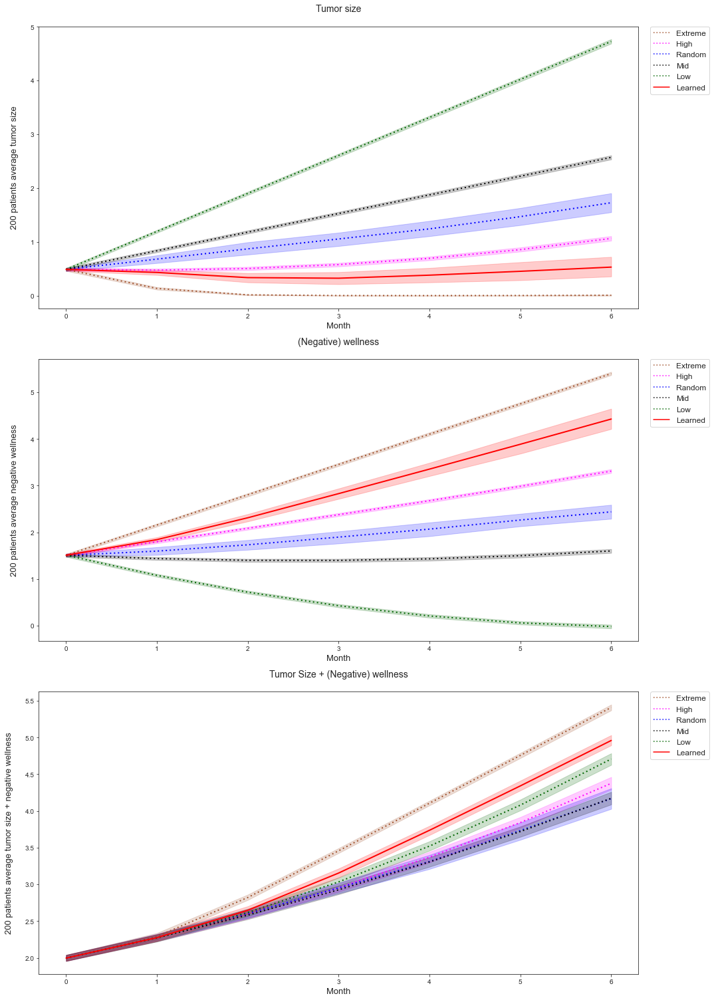


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 0.5313670857946845
                         - Avg. max. toxicity : 5.784159020075806
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1815602776071525
                         - Avg. prob. of death : 0.967076977257602



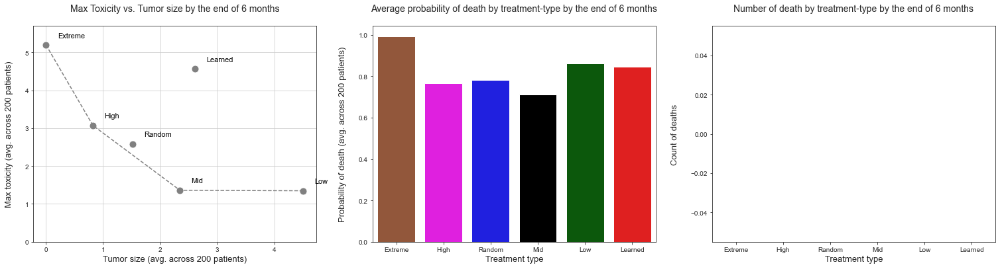

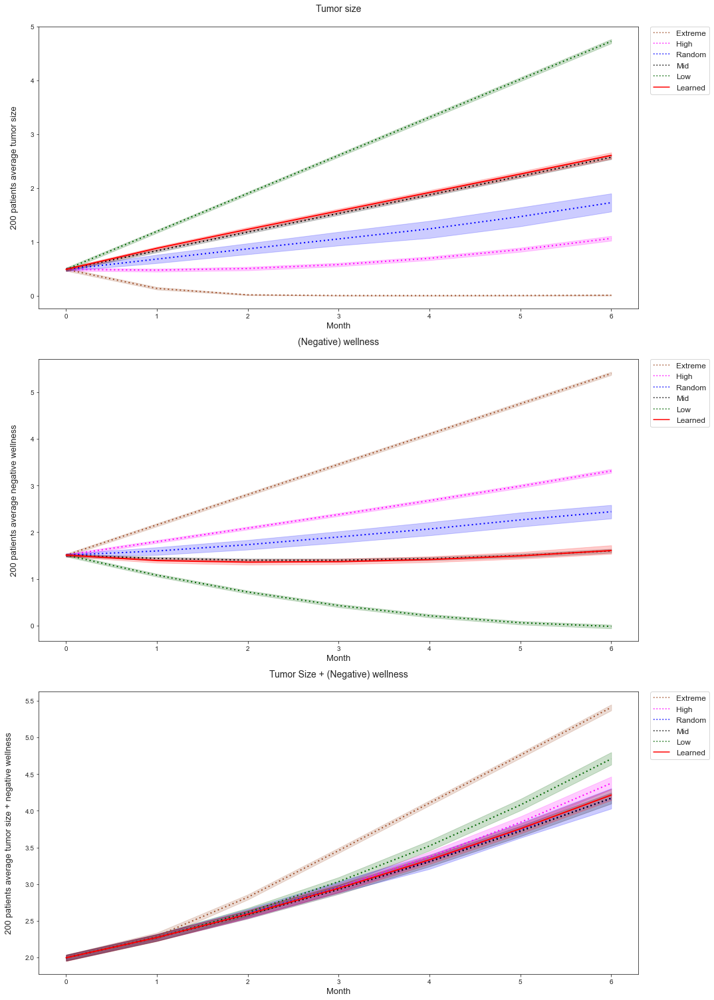


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 2.6081870773447333
                         - Avg. max. toxicity : 4.565041537806851
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1337925958992656
                         - Avg. prob. of death : 0.8465761930667868



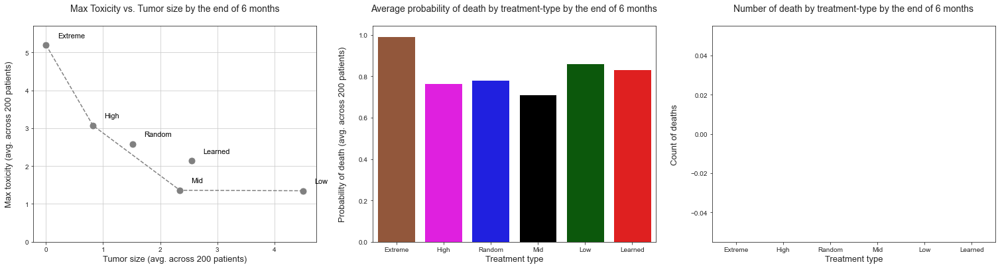

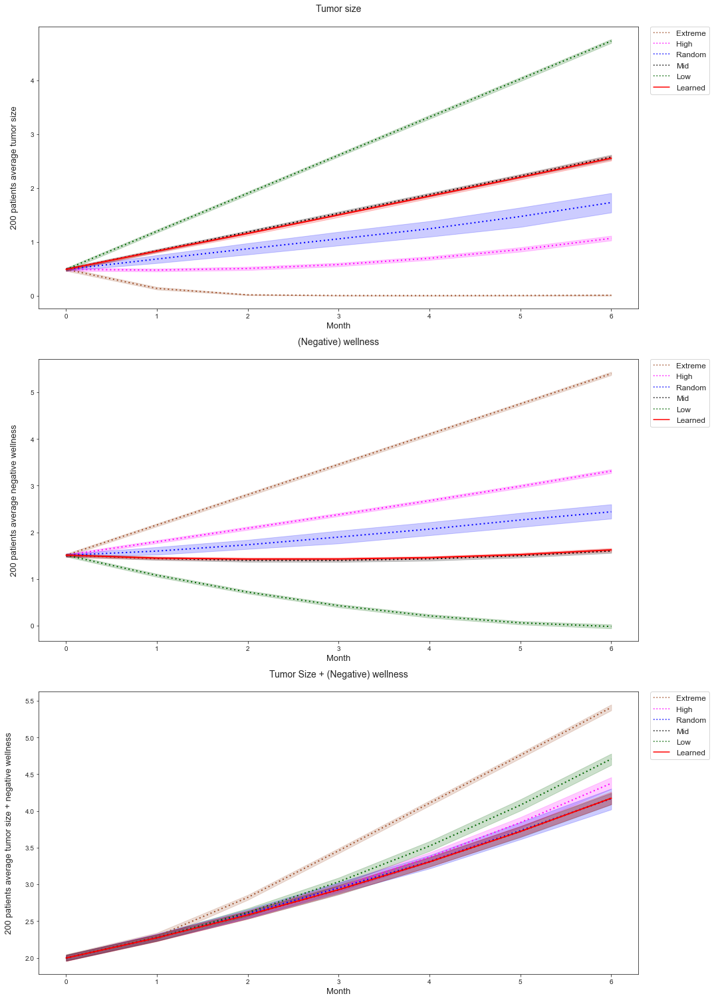


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 2.55052783033923
                         - Avg. max. toxicity : 2.1381165766074663
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1307074483238444
                         - Avg. prob. of death : 0.8348450516211448



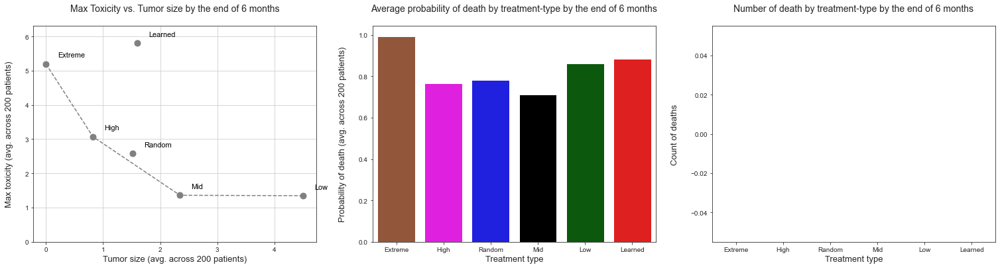

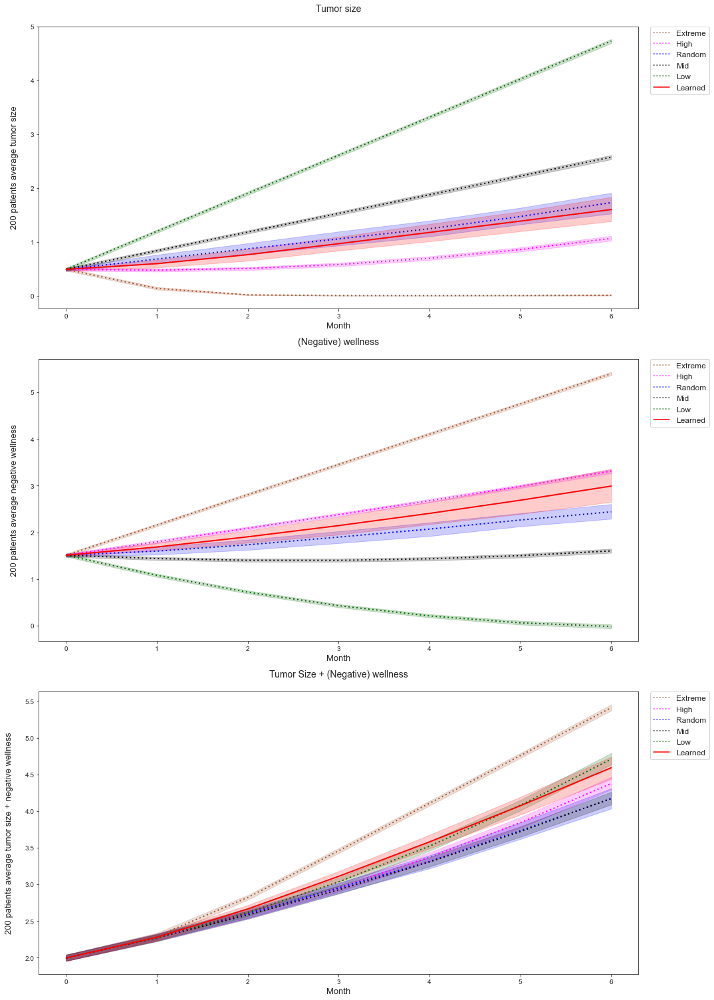


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 1.599156301904526
                         - Avg. max. toxicity : 5.805016988409732
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.162095244757412
                         - Avg. prob. of death : 0.8836354933223524



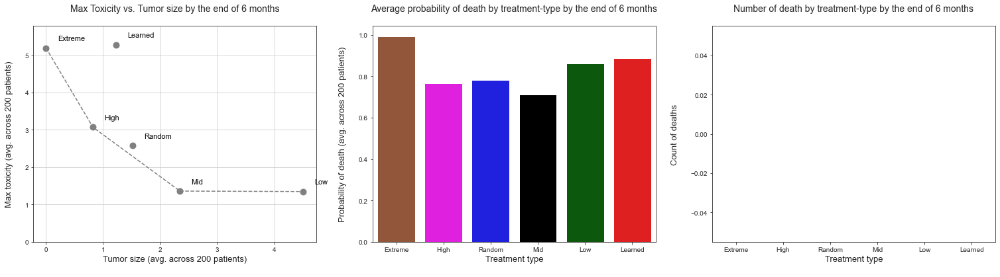

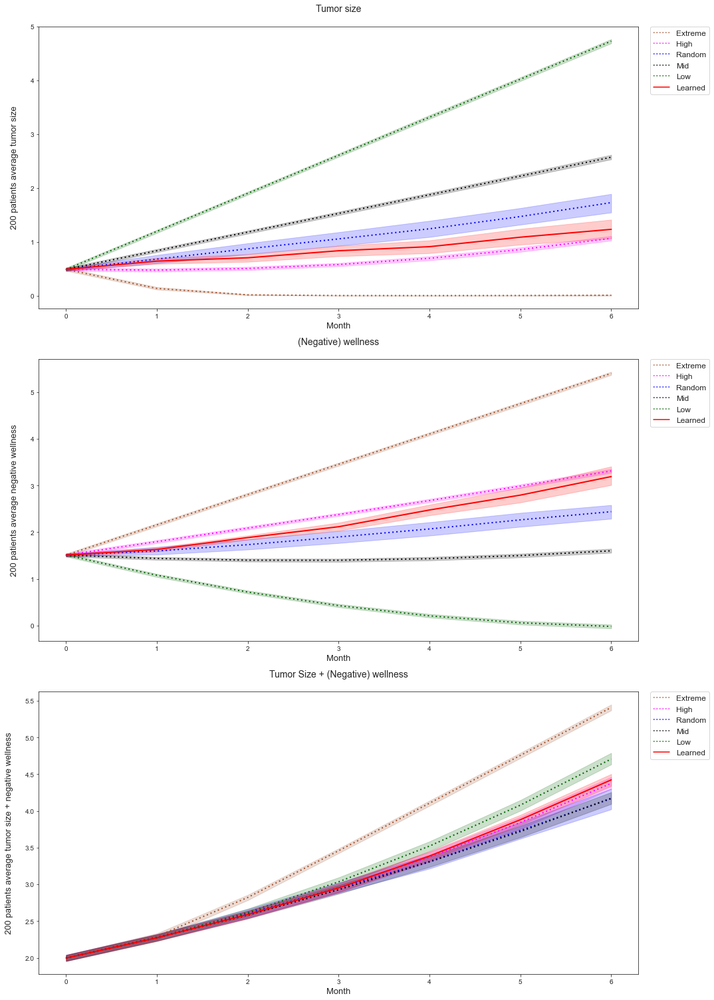


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 1.2320410848657875
                         - Avg. max. toxicity : 5.282957491003778
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.143124652437574
                         - Avg. prob. of death : 0.8872055316416392



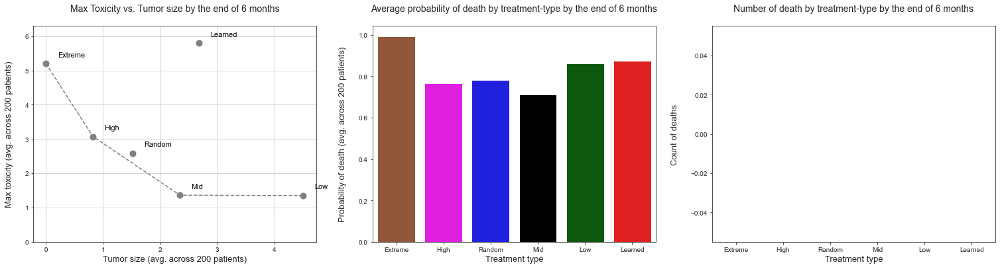

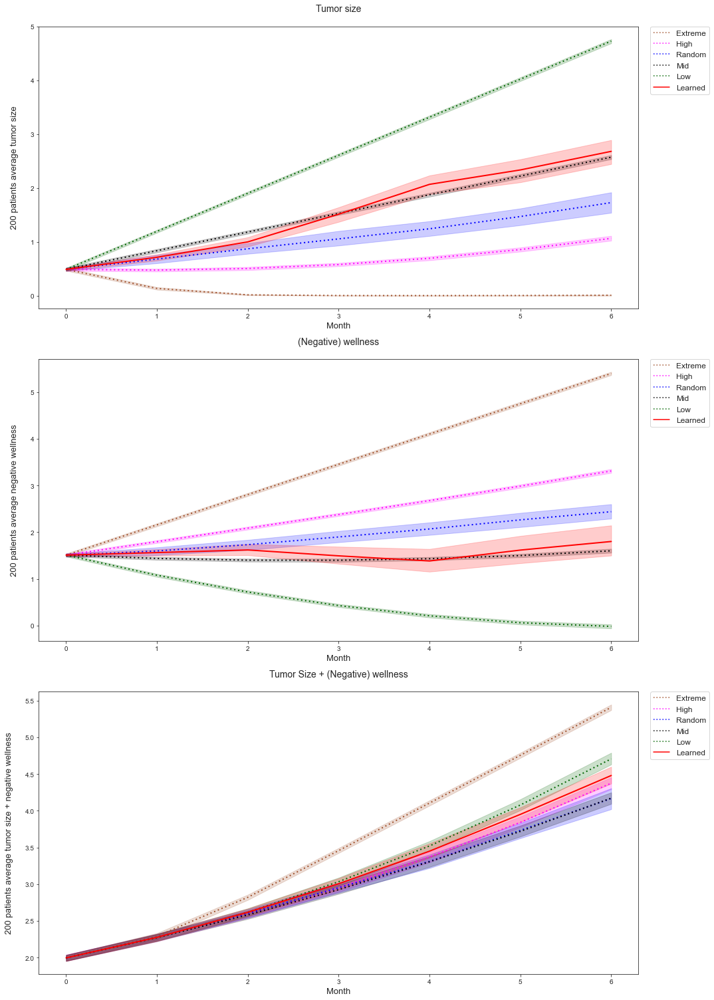


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 2.6801641370374942
                         - Avg. max. toxicity : 5.7942665184992
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1498175739069456
                         - Avg. prob. of death : 0.8763220188230798



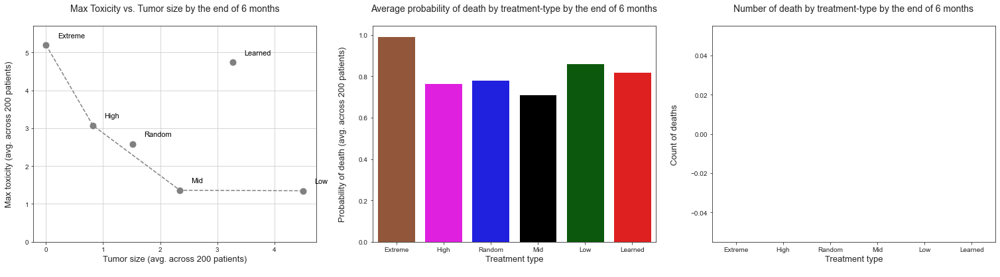

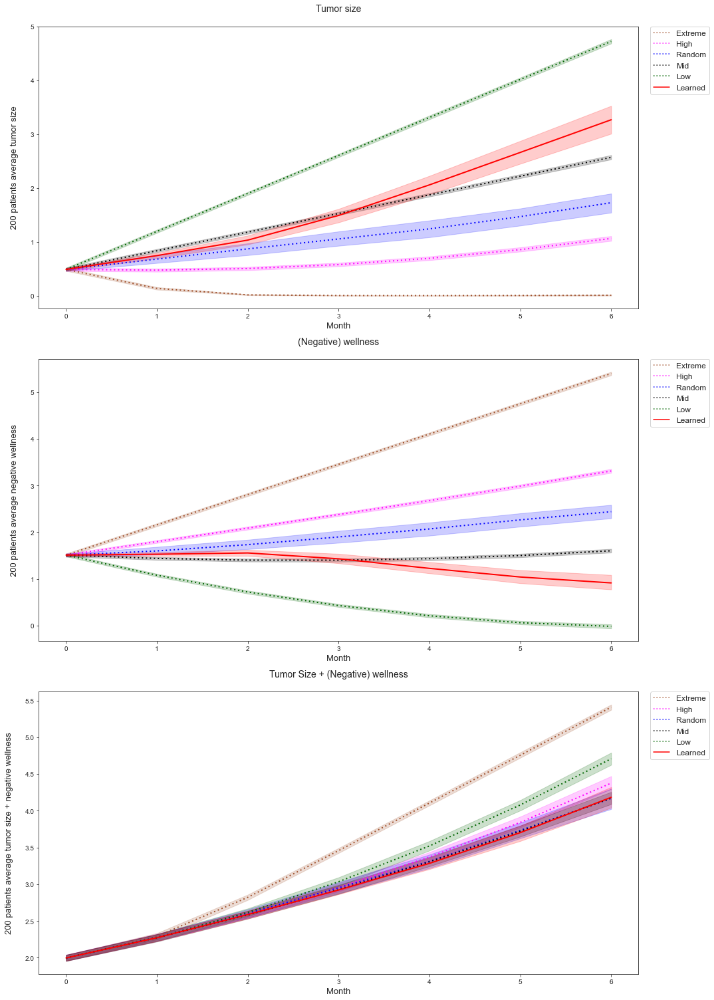


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.2705393263790246
                         - Avg. max. toxicity : 4.738616033606392
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.1300047802353497
                         - Avg. prob. of death : 0.8218024237566586



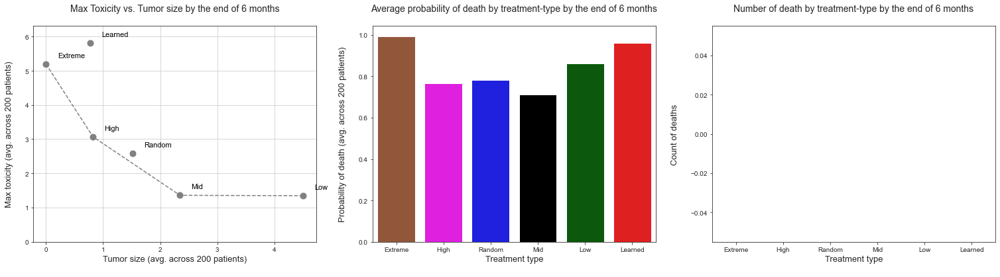

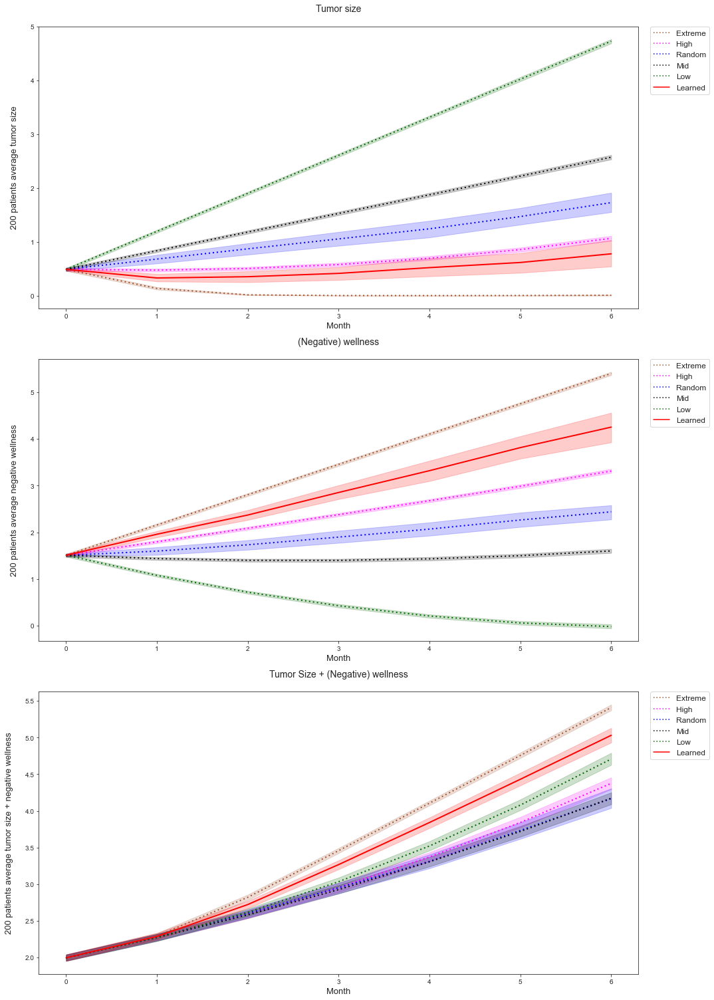


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 0.7775693941261883
                         - Avg. max. toxicity : 5.808269939370079
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.192672194606539
                         - Avg. prob. of death : 0.9617536837300346



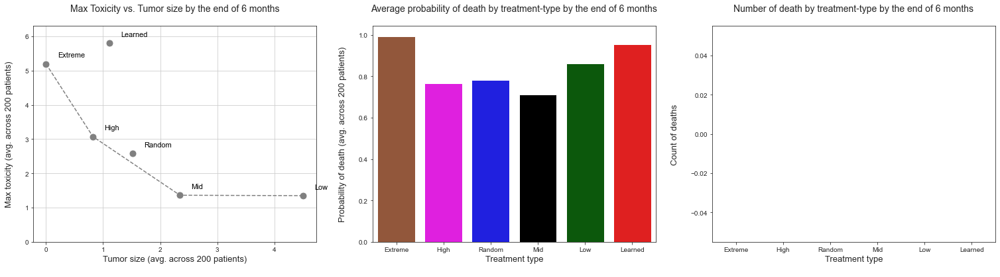

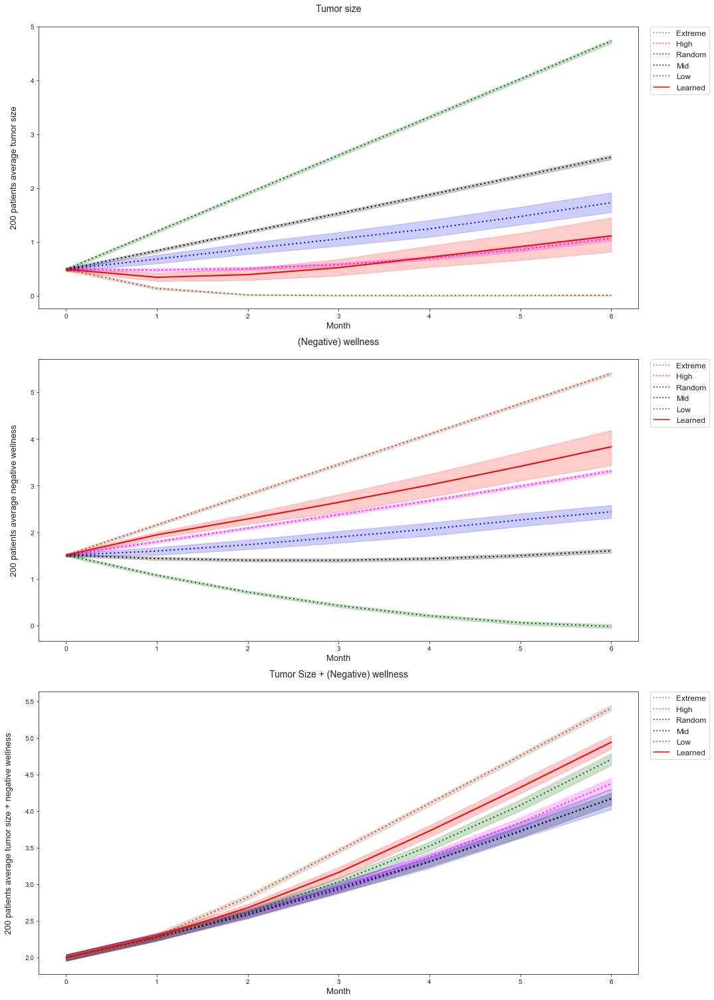


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 1.11000931335076
                         - Avg. max. toxicity : 5.800253185040833
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.181634596882192
                         - Avg. prob. of death : 0.9540990052722041


Evaluations: 100%|██████████| 1/1 [2:22:35<00:00, 8555.74s/it]


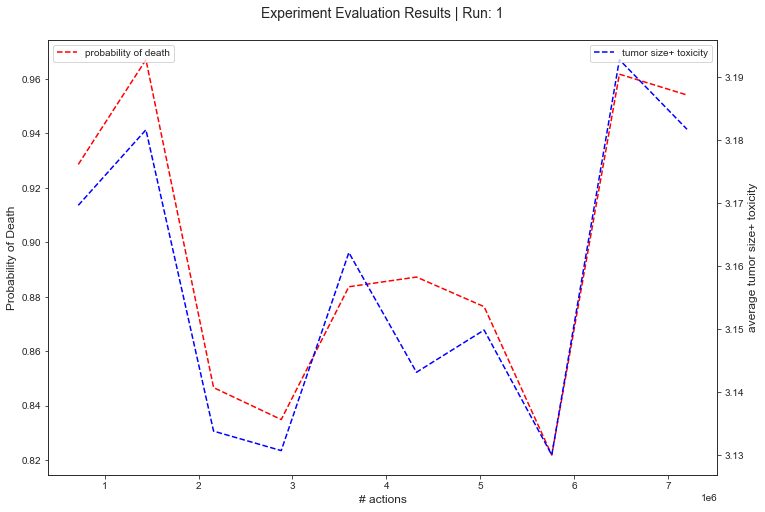

In [6]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 12
                                                , treatment_length_eval     = 12
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()